In [7]:
import json
  
# read json data file
f=open('taxi_requests.json')
data = json.load(f)
f.close()

login_times=data['request_time']

# uncomment next line to see how the data looks like
# display(login_times) 

In [12]:
# convert time string to timestamps
from datetime import datetime
import random
timestamps=[datetime.strptime(login_times[i], '%Y-%m-%d %H:%M:%S').timestamp() for i in range(len(login_times))]

# Written questions

Please search online and read the documentation for strptime() and timestamp() and write down short answers to the following questions:

A- What does the previous cell do? it uses strptime to get timestamps
  
    Ans :  It converts `login_times` to timestamp. How?
      1.   It uses strptime to create objects from the given string login_times
      2.   It uses timestamp() to convert the time objects into UNIX timestamp (the time since the epoch 1970 jan, 1)
      3.   It also uses list comprehension to iterate over list.


B- What does the concept of "timestamp" mean? What are its type and unit?

    Ans :
    1.   timestamp calculate the elapsed time since 1 Jan 1970, where it first came aroud, in microseconds - class       time - type float.




C- Is the variable "timestamps" a list or a numpy array?

    Ans : 
    it's a list -> `type(timestamps)` = List




D- Which day of week (Sunday, Monday, ...) is 1970-01-01?

    Ans:
    print(datetime.fromtimestamp(timestamps[0]).weekday()) -> 3

E- Which function can convert a timestamp back to datetime?

    Ans:
    datetime.fromtimestamp(timestamp)





# Project questions

Explore data, write code, and search online to answer the following questions about the data:

1- How many days are there in the data?

2- Which date was the busiest date (the day with the most requests)? Which date was the second busiest date?

3- Which hour was the busiest hour (the hour with the most requests)?

4- Are there any two requests that happened at the same time?

5- What is the longest gap between two consequent requests?

6- Overall, does the volume of requests increase or decrease over time?

7- Bonus: For each day calculate the average request time for all requests between 6:00 AM and 9:00 AM

8- Bonus: Which day of week is the busiest?

9- Bonus: Calculate the average number of requests for each of the 7*24 hours of the week.

10- Bonus: Which dates other than the standard weekend days were holidays?

# Sample answer to problem 2

Here is an answer to problem 2. We advise to try to solve this problem before you see the answer below


In [13]:
import numpy as np

#1 , 2_1 

In [16]:
day_number=np.array(timestamps).astype(int)//(24*60*60)# find day number for all requests

unique, counts = np.unique(day_number, return_counts=True) # find how many requests are in each day

maxday=np.argmax(counts) # find the day with the maximum requests
print("day number" , len(unique))
print("the busiest day is day number ",unique[maxday])

day number 103
the busiest day is day number  92


#2_2

In [17]:
second_maxday = np.argwhere(counts == np.partition(counts.flatten(), -2)[-2])[0][0]
print("the second busiest day is day number ", unique[second_maxday])

the second busiest day is day number  72


#3









In [18]:
hours_list=[datetime.fromtimestamp(timestamps[i]).hour for i in range(len(login_times))]
hours_array = np.array(hours_list)
hours_unique, hours_counts = np.unique(hours_array, return_counts=True)
maxhour = np.argmax(hours_counts)
print("the busiest hour is", maxhour)

the busiest hour is 22


#4 /requests at same time

In [11]:
unique_timestamps, timestamps_counts = np.unique(timestamps, return_counts=True)
len(unique_timestamps[timestamps_counts>1])

868

#5 /longest gap

In [23]:
gap_list = np.diff(timestamps)
max_gap = np.max(gap_list)
print(max_gap)

5999.0


#6

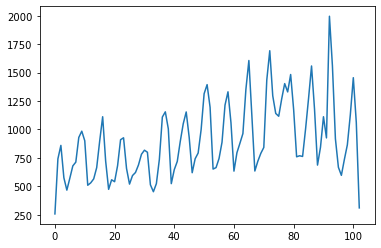

In [10]:
import matplotlib.pyplot as plt
plt.plot(unique, counts)
plt.show()

#7 /average request time between 6 and 9 

In [ ]:
import pandas as pd
day_id = np.arange(0, len(unique))
day_id_dict = {'day number': 0, 'day requests': 0}
temp_list = []
for day in day_id:
    day_id_dict['day number'] = day
    day_id_dict['day requests'] = 0
    temp_list.append(day_id_dict.copy())
    
new_list = list(zip(day_number, timestamps))
new_np_array = np.array(new_list)
daily_requests = []
for day in temp_list:
    for item in new_np_array:
        if item[0] == day['day number'] and datetime.fromtimestamp(item[1]).hour > 6 and datetime.fromtimestamp(item[1]).hour < 9:
            daily_requests.append(datetime.fromtimestamp(item[1]).hour)
    print("day", day['day number'])
    if(len(daily_requests) == 0):
        print(0)
    else:
        print(sum(daily_requests)/len(daily_requests))
    daily_requests.clear()


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0


10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0


15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0


21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0


25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0


29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0


35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0


38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0


42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0


46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0


50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0


51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0


56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0


58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
59.0
58.0
58.0
59.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
59.0
58.0
58.0
58.0
58.0
58.0
59.0
59.0
58.0
58.0
59.0
59.0
58.0
58.0
58.0
58.0
58.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
58.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0


62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0


65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0


68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
69.0
68.0
69.0
68.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0
69.0


72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0


74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0


77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0


79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0


83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0


86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0


90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0


96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0


100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0


10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0
11.0


16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0
16.0


21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0
21.0


25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
26.0
26.0
25.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0
26.0


30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
31.0
30.0
31.0
30.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0
31.0


36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0
36.0


39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0


43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0


46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0


50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0


53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0


57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0


60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
61.0
60.0
60.0
60.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0


64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0


66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0


71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0


73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0


75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0


78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0


80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
81.0
81.0
80.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0


83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0
83.0


86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0


89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0


95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0


99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0


101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.0
102.

4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0


9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0


14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0
14.0


18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0
18.0


23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
24.0
23.0
23.0
24.0
24.0
24.0
24.0
24.0
23.0
23.0
24.0
24.0
23.0
23.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0


28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
29.0
28.0
28.0
28.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0


34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0


38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0


42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0


45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0


49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
50.0
49.0
50.0
49.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0


52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0


56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0


59.0
58.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0


62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0


65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0


68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0


71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0


73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0


76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0


78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
79.0
78.0
78.0
78.0
78.0
79.0
78.0
78.0
78.0
79.0
79.0
79.0
79.0
79.0
78.0
79.0
79.0
79.0
78.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
78.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0


81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0


85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0
85.0


88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0
88.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0


93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
94.0
94.0
93.0
93.0
93.0
94.0
93.0
93.0
94.0
94.0
94.0
94.0
93.0
94.0
93.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0
94.0


98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0


101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.

4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
4.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0


8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0


12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0
12.0


17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0
17.0


22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
23.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
22.0
23.0
22.0
22.0
22.0
22.0
23.0
22.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0


28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0


32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0
32.0


37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0
37.0


42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0


45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0


49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0


52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0


57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0


60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0


64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0


66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0


71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0


72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0


75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
75.0
76.0
75.0
75.0
75.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0


78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0


80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0


84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0


86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
87.0
86.0
87.0
86.0
87.0
86.0
87.0
87.0
86.0
87.0
86.0
86.0
86.0
86.0
87.0
86.0
87.0
87.0
86.0
86.0
87.0
87.0
87.0
86.0
87.0
87.0
87.0
87.0
86.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0


90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
93.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
93.0
92.0
92.0
92.0
93.0
92.0
93.0
93.0
92.0
92.0
92.0
92.0
92.0
92.0
93.0
93.0
92.0
93.0
93.0
93.0
93.0
93.0
93.0
92.0
93.0
93.0
93.0
92.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0


96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0


100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0


10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0


15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0


20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0


24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0
25.0


30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0


35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0


38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0
39.0


42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0


45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0
45.0


49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
50.0
49.0
50.0
49.0
50.0
50.0
50.0
50.0
50.0
50.0


52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0


56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
57.0
56.0
57.0
56.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0


59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0
60.0


64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0
64.0


66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
66.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0


71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0


73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0


76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0


79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0


82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0
82.0


86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0


90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0


95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0


98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
98.0
99.0
98.0
98.0
99.0
99.0
98.0
99.0
99.0
99.0
99.0
99.0
98.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0


101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.0
101.

5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0


9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0


15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0


19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0


24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0


29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
30.0
29.0
29.0
29.0
29.0
30.0
30.0
30.0
30.0
29.0
29.0
30.0
29.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0


35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0


38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0


43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0


47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0


50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0


53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0


57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0
57.0


61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0


63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0


65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0


70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0
70.0


72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0
72.0


74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0


77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0
77.0


79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
80.0
79.0
79.0
79.0
80.0
80.0
79.0
79.0
80.0
79.0
80.0
80.0
80.0
79.0
79.0
79.0
80.0
79.0
79.0
79.0
79.0
80.0
80.0
80.0
79.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0
80.0


84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0


87.0
87.0
86.0
87.0
86.0
86.0
86.0
86.0
87.0
86.0
87.0
87.0
86.0
86.0
87.0
87.0
87.0
86.0
87.0
87.0
87.0
87.0
86.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0


90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
93.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
93.0
92.0
92.0
92.0
93.0
92.0
93.0
93.0
92.0
92.0
92.0
92.0
92.0
92.0
93.0
93.0
92.0
93.0
93.0
93.0
93.0
93.0
93.0
92.0
93.0
93.0
93.0
92.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0
93.0


96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
97.0
96.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0
97.0


100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.

2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0
2.0


7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
7.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0


9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
9.0
10.0
9.0
9.0
9.0
10.0
9.0
9.0
9.0
9.0
10.0
9.0
10.0
9.0
10.0
9.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0


15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0


19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0


23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0
23.0


28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
28.0
29.0
28.0
28.0
28.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0
29.0


33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
33.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0
34.0


38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0


42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0
42.0


46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
46.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0


49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
49.0
50.0
49.0
50.0
49.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0
50.0


52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
52.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0
53.0


56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0
56.0


58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
59.0
58.0
58.0
59.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
59.0
58.0
58.0
58.0
58.0
58.0
59.0
59.0
58.0
58.0
59.0
59.0
58.0
58.0
58.0
58.0
58.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
58.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0
59.0


62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
62.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0
63.0


65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0


68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0


71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
72.0
72.0
71.0
71.0
72.0
71.0
71.0
71.0
71.0
71.0


74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0
74.0


76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
77.0
76.0
76.0
76.0
76.0
77.0
76.0
77.0
77.0
76.0
77.0
77.0
77.0
77.0
77.0


78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0
78.0


81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0


84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0
84.0


86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
87.0
86.0
87.0
86.0
87.0
86.0
87.0
87.0
86.0
87.0
86.0
86.0
86.0
86.0
87.0
86.0
87.0
87.0
86.0
86.0
87.0
87.0
87.0
86.0
87.0
87.0
87.0
87.0
86.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0
87.0


90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0


92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0
92.0


95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
95.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0
96.0


99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0
99.0


1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0
6.0


10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0
10.0


15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0
15.0


19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
19.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0
20.0


24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0
24.0


30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0
30.0


35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0
35.0


38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0
38.0


43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0
43.0


47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0
47.0


51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0
51.0


55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0
55.0


58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0
58.0


61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0
61.0


65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0
65.0


67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
67.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0
68.0


71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0
71.0


73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0
73.0


76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0
76.0


79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0
79.0


81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0
81.0


86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0
86.0


89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0
89.0


#8

In [152]:
import math
week_number=np.array(timestamps).astype(int)//(24*60*60*7)
week_unique, week_counts = np.unique(week_number, return_counts=True)
week_dict = {'week number': 0, 'day in week': []}
l1 = []
l2=[]
for week in range(len(week_unique)):
    week_dict['week number'] = week
    for idx, day in enumerate(unique):
        if math.floor(day / 7) == week:
            l2.append((day, counts[idx]))
    week_dict['day in week'] += l2
    l1.append(week_dict.copy())
    l2.clear()

l1

[{'week number': 0,
  'day in week': [(0, 258),
   (1, 742),
   (2, 860),
   (3, 576),
   (4, 467),
   (5, 572),
   (6, 680),
   (7, 713),
   (8, 930),
   (9, 985),
   (10, 901),
   (11, 510),
   (12, 531),
   (13, 566),
   (14, 665),
   (15, 898),
   (16, 1112),
   (17, 723),
   (18, 474),
   (19, 558),
   (20, 541),
   (21, 682),
   (22, 910),
   (23, 927),
   (24, 657),
   (25, 520),
   (26, 595),
   (27, 622),
   (28, 688),
   (29, 782),
   (30, 818),
   (31, 800),
   (32, 514),
   (33, 453),
   (34, 524),
   (35, 737),
   (36, 1109),
   (37, 1155),
   (38, 1006),
   (39, 524),
   (40, 647),
   (41, 719),
   (42, 894),
   (43, 1050),
   (44, 1154),
   (45, 930),
   (46, 620),
   (47, 743),
   (48, 793),
   (49, 999),
   (50, 1314),
   (51, 1394),
   (52, 1195),
   (53, 652),
   (54, 665),
   (55, 745),
   (56, 888),
   (57, 1214),
   (58, 1331),
   (59, 1059),
   (60, 634),
   (61, 796),
   (62, 879),
   (63, 964),
   (64, 1352),
   (65, 1606),
   (66, 1122),
   (67, 635),
   (68, 